In [ ]:
#!python -m pip install spacy~=3.3.3
#!python -m pip install scispacy
#!python -m pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.4.0/en_core_sci_sm-0.4.0.tar.gz
#!python -m pip install gensim
#!python -m pip install scikit-learn

In [24]:
#!pip install --upgrade google-cloud-bigquery
#from google.colab import auth
#auth.authenticate_user()
import pandas as pd
from pandasql import sqldf, load_meat, load_births
pysqldf = lambda q: sqldf(q, globals())
#from google.cloud import bigquery
#client = bigquery.Client(project="caramel-aria-437300-t0")

df_1 = pd.read_csv('NOTEEVENTS.csv')
df_2 = pd.read_csv('DIAGNOSES_ICD.csv')
# Define your query as a string
query = """
SELECT n.TEXT
FROM df_1 n
INNER JOIN df_2 d
ON d.HADM_ID = n.HADM_ID
WHERE d.ICD9_CODE = '49390'
AND n.CATEGORY = 'Discharge summary'
"""

# Run the query
df = pysqldf(query)


# Display the first few rows of the DataFrame
df.head()

C:\Users\tom\AppData\Local\Temp\ipykernel_19092\4026415271.py:10: DtypeWarning: Columns (4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  df_1 = pd.read_csv('NOTEEVENTS.csv')


,TEXT
0,Admission Date: [**2203-11-3**] ...
1,Admission Date: [**2174-2-12**] ...
2,Admission Date: [**2101-10-25**] ...
3,Admission Date: [**2199-3-18**] ...
4,Admission Date: [**2144-2-4**] D...


In [25]:
import pandas as pd
import numpy as np
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk

nltk.download('punkt')
nltk.download('stopwords')

# Assuming df is already loaded with the sample texts
notes = df['TEXT'].tolist()

def clean_text(text):
    # Convert to lowercase
    text = text.lower()

    # Remove special characters and numbers
    text = re.sub(r'[^a-zA-Z\s]', '', text)

    # Tokenize
    tokens = word_tokenize(text)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]

    # Join tokens back into string
    cleaned_text = ' '.join(tokens)

    return cleaned_text


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\tom\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tom\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [26]:
cleaned_texts = [clean_text(text) for text in notes]

In [ ]:
#!python -m spacy download en_core_web_sm

In [27]:
import spacy

nlp = spacy.load('en_core_web_sm')

def extract_spacy_entities(text):
    doc = nlp(text)
    return [(ent.text, ent.label_) for ent in doc.ents]

spacy_entities = []

for i, text in enumerate(cleaned_texts):
    if i%100 == 0:
        print(str(float(i / len(cleaned_texts)) * 100))
    spacy_entities.append(extract_spacy_entities(text))

# Print Spacy entities
for i, entities in enumerate(spacy_entities):
    print(f"Text {i+1} entities:")
    for entity in entities:
        print(f"  {entity[0]} - {entity[1]}")
    print()

0.0
4.340277777777778
8.680555555555555
13.020833333333334
17.36111111111111
21.70138888888889
26.041666666666668
30.381944444444443
34.72222222222222
39.0625
43.40277777777778
47.74305555555556
52.083333333333336
56.423611111111114
60.763888888888886
65.10416666666666
69.44444444444444
73.78472222222221
78.125
82.46527777777779
86.80555555555556
91.14583333333334
95.48611111111111
99.82638888888889
Text 1 entities:
  yo w ho - PERSON
  k rf ivdu - PERSON
  prior fall - DATE
  cefazolin fu mri - PERSON
  weeks - DATE
  cefazolin - ORG
  night - TIME
  morning - TIME
  mm hg - PERSON
  ra mm hg - PERSON
  k perscribed haart - PERSON
  past months - DATE
  telephonefax - GPE
  approximately years ago - DATE
  ho ivdu - PERSON
  telephonefax - GPE
  cefazolin - ORG
  ivdu - PERSON
  abd bs - PERSON
  ext raka - ORG
  cce - ORG
  xanthomas - ORG
  albumin pm - PERSON
  eos - ORG
  metas pm lactate pm - ORG
  pm ckcpk pm ctropnt pm - PERSON
  hct mcv - PERSON
  monos eos - PERSON
  pm plt -

In [45]:
spacyWordDict = dict()
for i, entities in enumerate(spacy_entities):
    for entity in entities:
        kv = (entity[0], entity[1])
        if kv in spacyWordDict:
            spacyWordDict[kv] += 1
        else:
            spacyWordDict[kv] = 1
spacyWords = []
for kv in spacyWordDict.keys():
    spacyWords.append((kv[0], kv[1], spacyWordDict[kv]))
spacyWords = sorted(spacyWords, key=lambda x: x[2], reverse=True)
spacyWords = spacyWords[0:20]

spacyDf = pd.DataFrame(spacyWords, columns=['Word', 'Category', 'Count'])
print(spacyDf)

                     Word  Category  Count
0                   daily      DATE  17008
1                     one  CARDINAL   6388
2                   first   ORDINAL   6142
3                      un       ORG   4481
4                     two  CARDINAL   3560
5             every hours      TIME   3514
6                      po       GPE   2625
7            telephonefax       GPE   2606
8    hct mcv mch mchc rdw    PERSON   1975
9                      ec       ORG   1518
10                  weeks      DATE   1517
11                  three  CARDINAL   1293
12       po bid times day       ORG   1269
13                    day      DATE   1114
14                     mm    PERSON    853
15              monos eos    PERSON    832
16                  hours      TIME    724
17                   days      DATE    717
18                   four  CARDINAL    702
19  tablet sig one tablet       ORG    680


In [ ]:
#!pip install spacy==3.0.0

In [ ]:
#!pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.5.1/en_ner_bc5cdr_md-0.5.1.tar.gz

In [28]:
import scispacy
import en_ner_bc5cdr_md

nlp_sci = en_ner_bc5cdr_md.load()

def extract_scispacy_entities(text):
    doc = nlp_sci(text)
    return [(ent.text, ent.label_) for ent in doc.ents]

scispacy_entities = [extract_scispacy_entities(text) for text in cleaned_texts]

# Print SciSpacy entities
for i, entities in enumerate(scispacy_entities):
    print(f"Text {i+1} entities:")
    for entity in entities:
        print(f"  {entity[0]} - {entity[1]}")
    print()


Text 1 entities:
  medicine allergies penicillins attendingfirst - DISEASE
  shortness breath - DISEASE
  chest pain - DISEASE
  pericardiocentesis - DISEASE
  illness - DISEASE
  endocarditis - DISEASE
  pericardial tamponade - DISEASE
  osteomyelitis - DISEASE
  pain - DISEASE
  gout - DISEASE
  cefazolin - CHEMICAL
  osteomyelitis - DISEASE
  cefazolin - CHEMICAL
  chest pain - DISEASE
  stroke - DISEASE
  venous thrombosis pulmonary embolism bleeding - DISEASE
  myalgias - DISEASE
  pains cough hemoptysis black stools red stools - DISEASE
  fevers chills rigors - DISEASE
  exertional buttock - DISEASE
  pain - DISEASE
  dignosed - DISEASE
  myocardial infarction - DISEASE
  endocarditits - DISEASE
  epididimitis - DISEASE
  methadone - CHEMICAL
  telephonefax asthma osteomyelitis - DISEASE
  cefazolin - CHEMICAL
  methadone - CHEMICAL
  bitemporal wasting - DISEASE
  cyanosis - DISEASE
  scoliosis kyphosis - CHEMICAL
  cce - CHEMICAL
  hematoma skin stasis dermatitis - DISEASE
  xa

In [46]:
scispacyWordDict = dict()
for i, entities in enumerate(scispacy_entities):
    for entity in entities:
        kv = (entity[0], entity[1])
        if kv in scispacyWordDict:
            scispacyWordDict[kv] += 1
        else:
            scispacyWordDict[kv] = 1
scispacyWords = []
for kv in scispacyWordDict.keys():
    scispacyWords.append((kv[0], kv[1], scispacyWordDict[kv]))
scispacyWords = sorted(scispacyWords, key=lambda x: x[2], reverse=True)
scispacyWords = scispacyWords[0:20]

scispacyDf = pd.DataFrame(scispacyWords, columns=['Word', 'Category', 'Count'])
print(scispacyDf)

              Word  Category  Count
0             pain   DISEASE   4953
1          glucose  CHEMICAL   2699
2          aspirin  CHEMICAL   1709
3          calcium  CHEMICAL   1509
4        allergies   DISEASE   1461
5           asthma   DISEASE   1399
6        pneumonia   DISEASE   1349
7            lasix  CHEMICAL   1320
8          heparin  CHEMICAL   1283
9        albuterol  CHEMICAL   1243
10       infection   DISEASE   1239
11      chest pain   DISEASE   1188
12        bleeding   DISEASE    949
13      lisinopril  CHEMICAL    935
14         alcohol  CHEMICAL    908
15          oxygen  CHEMICAL    865
16      prednisone  CHEMICAL    862
17         lactate  CHEMICAL    846
18           edema   DISEASE    840
19  abdominal pain   DISEASE    834


In [44]:
from gensim.models import Word2Vec

# Tokenize cleaned texts
tokenized_texts = [text.split() for text in cleaned_texts]

# Train Word2Vec model
model = Word2Vec(tokenized_texts, vector_size=100, window=5, min_count=1, workers=4)

# Example usage
medical_terms = ['patient', 'lungs', 'asthma', 'pressure', 'medication']
for term in medical_terms:
    if term in model.wv:
        similar_words = model.wv.most_similar(term, topn=5)
        print(f"Words similar to '{term}':")
        for word, score in similar_words:
            print(f"  {word}: {score:.4f}")
    else:
        print(f"'{term}' not in vocabulary")
    print()

Words similar to 'patient':
  patients: 0.6179
  pt: 0.6091
  events: 0.5594
  point: 0.5521
  subsequently: 0.5359

Words similar to 'lungs':
  auscultation: 0.8044
  inspiratory: 0.7500
  bases: 0.7413
  anteriorly: 0.7304
  crackles: 0.7083

Words similar to 'asthma':
  gerd: 0.8247
  gout: 0.8029
  hypothyroidism: 0.8020
  hypercholesterolemia: 0.7957
  hyperlipidemia: 0.7744

Words similar to 'pressure':
  pressures: 0.8412
  presure: 0.6927
  culturessurveillance: 0.6785
  pressur: 0.6562
  sugar: 0.6544

Words similar to 'medication':
  medicines: 0.7734
  narcotics: 0.6972
  instead: 0.6804
  stop: 0.6799
  meds: 0.6705

Words similar to 'foot':
  wrist: 0.8358
  shoulder: 0.8299
  toe: 0.8268
  hand: 0.8145
  forearm: 0.8056



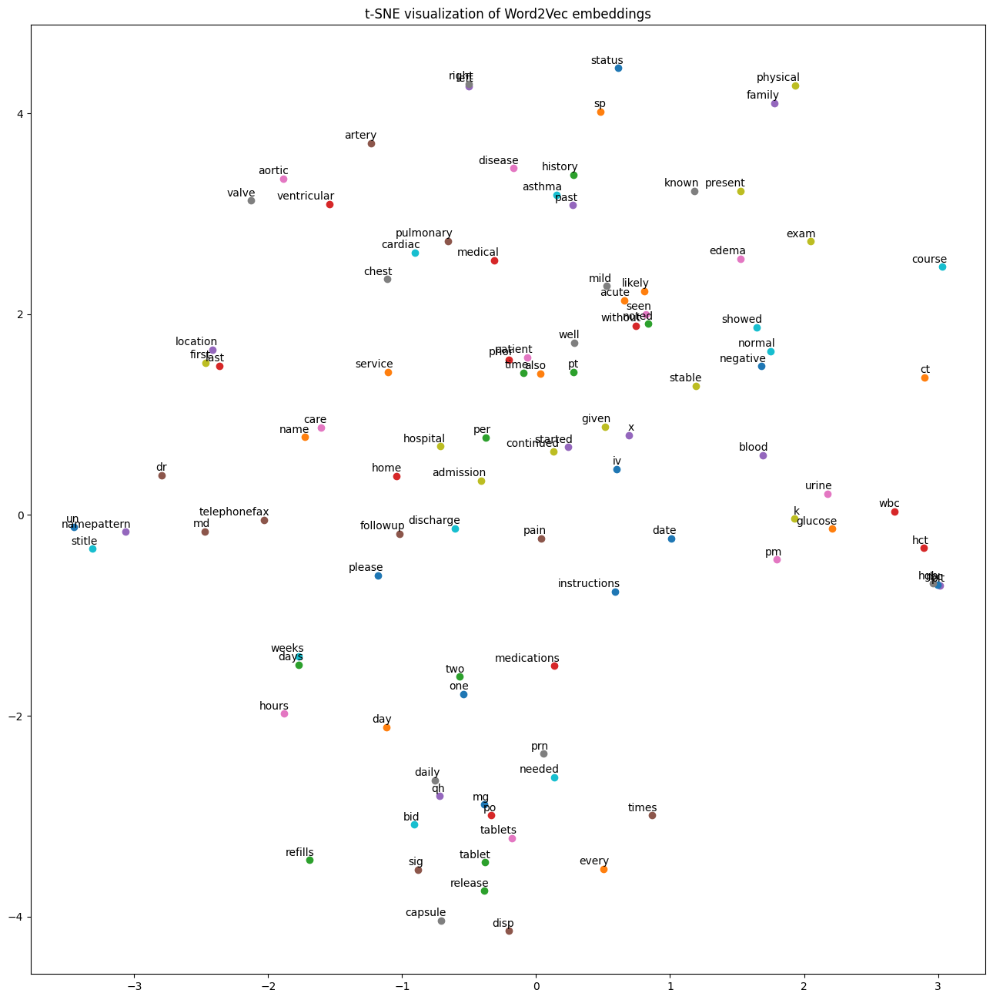

In [37]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []
    tokenwords = []
    for word in model.wv.key_to_index:
        tokenwords.append((model.wv[word], word, model.wv.get_vecattr(word, "count")))
    
    tokenwords = sorted(tokenwords, key=lambda x: x[2], reverse=True)
    tokenwords = tokenwords[0:100]
    for element in tokenwords:
        tokens.append(element[0])
        labels.append(element[1])

    tokens = np.array(tokens)
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(16, 16))
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.title("t-SNE visualization of Word2Vec embeddings")
    plt.show()

tsne_plot(model)